In [26]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [27]:
# import os
# os.environ["TF_FORCE_GPU_ALLOW_GROWTH"]="true"

In [28]:
%autoreload

import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import xgboost as xgb
import catboost as cb
import lightgbm as lgb

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score,\
                            recall_score, fbeta_score, precision_recall_curve

from tqdm.notebook import tqdm
from datetime import timedelta, datetime
import numpy as np
import matplotlib.pyplot as plt

from hyperopt import hp
import hyperopt.pyll
from hyperopt.pyll import scope
from hyperopt import STATUS_OK
from hyperopt import fmin, tpe, Trials

import sys
sys.path.append('../../Pipeline')

from ml_utils import plot_confusion_matrix, plot_precision_recall, arg_nearest
from utils import moving_average, reverse_mod


In [29]:
original_df = pd.read_csv('../../../data/cleandata/Info pluviometricas/Merged Data/repaired.csv', sep = ';')
original_df['Data_Hora'] = pd.to_datetime(original_df['Data_Hora'])
original_df['Date'] = original_df['Data_Hora'].dt.date

In [30]:
interest_cols = list({c.split('_')[0] for c in original_df.columns if '_error' in c})
interest_cols.remove('TemperaturaInterna')
interest_cols.remove('SensacaoTermica')

# Group Stations - Mean 

In [31]:
for c in interest_cols:
#     original_df[c] = (original_df[c+'_0'] + original_df[c+'_1'] +
#                       original_df[c+'_2'] + original_df[c+'_3'] + original_df[c+'_4'])/5 
    original_df[c] = original_df[c+'_0']


## Plot data

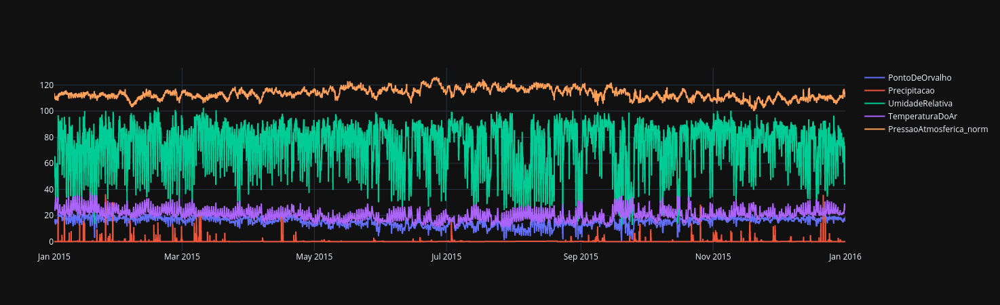

In [32]:
df_plot = original_df[original_df.Data_Hora.dt.year == 2015]

fig = go.Figure(layout=dict(template = 'plotly_dark'))

value = df_plot.loc[:, 'PressaoAtmosferica'].copy() - df_plot.loc[:, 'PressaoAtmosferica'].min() + 100
df_plot.insert(df_plot.shape[1], 'PressaoAtmosferica_norm', value)

for col in ['PontoDeOrvalho', 'Precipitacao', 'UmidadeRelativa', 'TemperaturaDoAr', 'PressaoAtmosferica_norm']:    
    fig.add_trace(go.Scatter(
        x = df_plot['Data_Hora'],
        y = df_plot[col],
        name = col,
                            )
                 )
fig.show()

# Feature Engineering

In [33]:
interest_cols += ['Diff_Temp_POrvalho']
original_df['Diff_Temp_POrvalho'] = original_df['TemperaturaDoAr'] -  original_df['PontoDeOrvalho']

# Create Hour-wise DataFrame 

In [34]:
hours = 24

unique_values = np.arange(0, len(original_df), 1)
n_group = hours * 4

h_id = np.repeat(unique_values, n_group)
original_df['h_id'] = h_id[:len(original_df)]

In [35]:
drop_rows = original_df.groupby('h_id').count().iloc[:,0] < n_group
drop_rows = drop_rows[drop_rows].index.to_list()

In [36]:
drop_rows = original_df.groupby('h_id').count().iloc[:,0] < n_group
drop_rows = drop_rows[drop_rows].index.to_list()

for row in drop_rows:
    original_df = original_df[original_df.h_id != row]
    

In [37]:
map_ = original_df.loc[n_group-1::n_group, ['Data_Hora', 'h_id']].set_index('h_id').to_dict()['Data_Hora']

## Has Rain

In [38]:
precipitacao_sum = original_df.loc[:, ['h_id', 'Precipitacao']].groupby('h_id').sum()

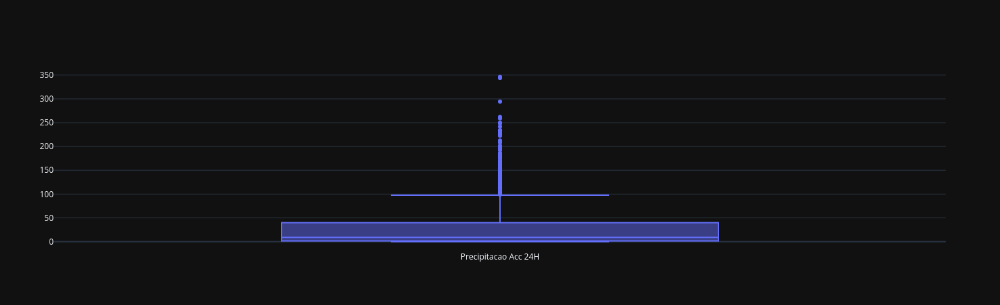

In [39]:
y = precipitacao_sum.loc[precipitacao_sum['Precipitacao'] != 0, 'Precipitacao'].values

fig = go.Figure()

fig.add_trace(go.Box(
    name = f'Precipitacao Acc {hours}H',
    y = y,
                    ))
fig.update_layout(template='plotly_dark')
fig.show()

In [40]:
has_rain_treshold = 0.01
shift = 2

precipitacao_sum.loc[:, 'Rain_Now'] = (precipitacao_sum['Precipitacao'] > has_rain_treshold ).astype(int)
precipitacao_sum.loc[:, f'Rain_Next_{hours}H'] = precipitacao_sum.loc[:, 'Rain_Now'].shift(-shift)
precipitacao_sum = precipitacao_sum.dropna()

# Remove last index (h_id) from original_df
for i in range(shift):
    last_index = original_df.groupby('h_id').count().iloc[:,0].index[-1]
    original_df = original_df[original_df.h_id != last_index]

precipitacao_sum.head(10)


,Precipitacao,Rain_Now,Rain_Next_24H
h_id,,,
0,0.6,1,1.0
1,183.0,1,1.0
2,87.0,1,1.0
3,58.4,1,1.0
4,15.6,1,1.0
5,47.6,1,1.0
6,75.2,1,1.0
7,79.2,1,1.0
8,9.4,1,1.0


In [41]:
df = precipitacao_sum.loc[:, ['Rain_Now', f'Rain_Next_{hours}H']]

## Simple Metrics

In [42]:
interest_cols.remove('DirecaoDoVento')

sum_df = original_df[interest_cols + ['h_id']].groupby('h_id').sum()
sum_df.columns = [c + '_sum' for c in sum_df.columns]
sum_df = sum_df.loc[:,'Precipitacao_sum']


In [43]:
# df = pd.concat([df, mean_df], axis = 1)
df = pd.concat([df, sum_df], axis = 1)
df.index = df.index.map(map_)
df = df.dropna()

In [44]:
df.head()

,Rain_Now,Rain_Next_24H,Precipitacao_sum
h_id,,,
2011-01-01 23:45:00,1,1.0,0.6
2011-01-02 23:45:00,1,1.0,183.0
2011-01-03 23:45:00,1,1.0,87.0
2011-01-04 23:45:00,1,1.0,58.4
2011-01-05 23:45:00,1,1.0,15.6


In [45]:
def make_timeseries(reference_dates, data_source, label_source, select_cols, hours_delta):
        
    n = len(reference_dates) # Number of samples
    m = len(select_cols)     # Number of features
    t = hours_delta * 4      # Length of timeseries
    X = np.empty(shape = [n, t, m], dtype = np.float64)
    hours = np.empty(shape = [n, t], dtype =  np.dtype('<M8[ns]'))
    y = np.empty(shape = [n], dtype = np.int8)
    
    bar = tqdm(total=n)
    
    for i, end_time in enumerate(reference_dates):
        start_time = end_time - timedelta(hours = hours_delta)
        X[i,:,:] = data_source.loc[(data_source['Data_Hora'] >= start_time) & 
                            (data_source['Data_Hora'] < end_time), select_cols].values
        hours[i, : ] = data_source.loc[(data_source['Data_Hora'] >= start_time) & 
                            (data_source['Data_Hora'] < end_time), 'Data_Hora'].values

        y[i] = label_source[label_source.index == end_time].values.item()
        bar.update(1)
        
    return X, y, hours

In [46]:
hours_delta = 24
X, y, time = make_timeseries(df.iloc[hours_delta*4:].index, original_df, df[f'Rain_Next_{hours}H'], interest_cols, hours_delta)

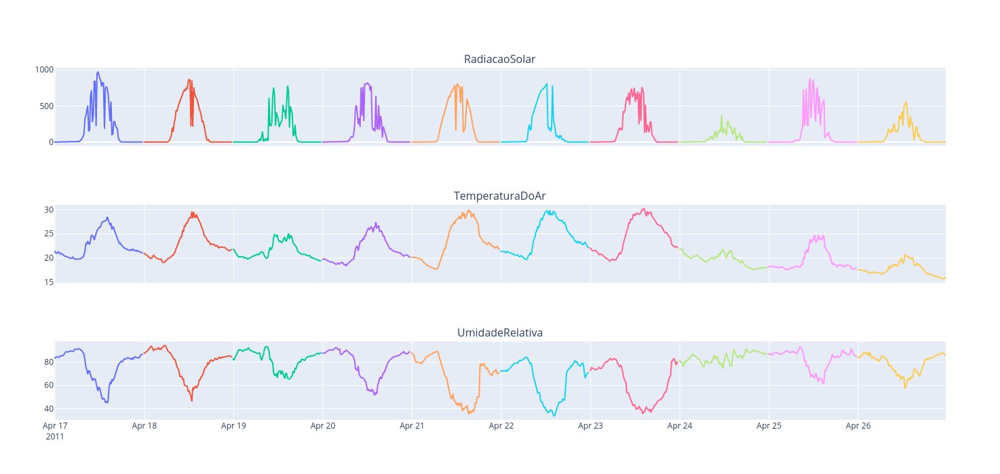

In [68]:
from plotly.subplots import make_subplots


selected1 = 'RadiacaoSolar'
idx1 = interest_cols.index(selected1)

selected2 = 'TemperaturaDoAr'
idx2 = interest_cols.index(selected2)

selected3 = 'UmidadeRelativa'
idx3 = interest_cols.index(selected3)

fig = make_subplots(3,1, shared_xaxes = True, subplot_titles=(selected1, selected2, selected3))
for i in range(10,20):
    x = pd.to_datetime(pd.DataFrame(time[i,:])[0])
    fig.add_trace(go.Scatter(
        x = x,
        y = X[i, :, idx1],
        name = interest_cols[0],
    ), col = 1, row = 1)
    
for i in range(10,20):
    x = pd.to_datetime(pd.DataFrame(time[i,:])[0])
    fig.add_trace(go.Scatter(
        x = x,
        y = X[i, :, idx2],
        name = interest_cols[-2],
    ), col = 1, row = 2)
    
for i in range(10,20):
    x = pd.to_datetime(pd.DataFrame(time[i,:])[0])
    fig.add_trace(go.Scatter(
        x = x,
        y = X[i, :, idx3],
        name = interest_cols[-2],
    ), col = 1, row = 3)

# fig.update_xaxes(range=[time[0,:][0] , time[-1,:][0] ])
fig.update_layout(showlegend = False,
                height = 700,
                width = 900
                )
fig.show()

In [ ]:
import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], enable=True)
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.sequence import pad_sequences

METRICS = [
      tf.keras.metrics.BinaryAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc'),
        ]

def plot_history(history, key):
      # Use a log scale to show the wide range of values.
    plt.plot(history.epoch,  history.history[key],
               color='b', label = 'train')
    plt.plot(history.epoch,  history.history[f'val_{key}'],
               color='orange', label = 'test')
    plt.xlabel('Epoch')
    plt.ylabel(key)
  
    plt.legend()
    
def plot_metrics(history):
    metrics =  ['loss', 'auc', 'precision', 'recall']
    for n, metric in enumerate(metrics):
        name = metric.replace("_"," ").capitalize()
        plt.subplot(2,2,n+1)
        plt.plot(history.epoch,  history.history[metric], color=colors[0], label='Train')
        plt.xlabel('Epoch')
        plt.ylabel(name)
        if metric == 'loss':
            plt.ylim([0, plt.ylim()[1]])
        elif metric == 'auc':
            plt.ylim([0.8,1])
        else:
              plt.ylim([0,1])

    plt.legend()
    
def make_model(shape, metrics = METRICS, output_bias=None):
    if output_bias is not None:
        output_bias = tf.keras.initializers.Constant(output_bias)
        
    adam = Adam(lr=0.001)

    model = Sequential()
    #model.add(LSTM(64, return_sequences=True, input_shape=(shape[1], shape[2])))
    model.add(LSTM(64, return_sequences=False, input_shape=(shape[1], shape[2])))
    #model.add(Dropout(0.3))
    #model.add(LSTM(64))
    model.add(Dense(10))
    model.add(Dropout(0.3))
    #model.add(Dense(units=64, activation='relu'))
    model.add(Dense(units=1, activation='sigmoid'))
    
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=metrics)

    return model
    
EPOCHS = 50
BATCH_SIZE = 200

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='loss', 
    verbose=1,
    patience=10,
    mode='max',
    restore_best_weights=True)

In [ ]:
model = make_model(shape=X.shape)
model.summary()

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
                                    X, y, test_size=0.33, random_state=42)

In [ ]:
X_test.shape, X_train.shape, y_test.shape, y_train.shape

In [ ]:
for i in tqdm(range(20)):
    model.fit(
        X_train,
        y_train,
        batch_size=BATCH_SIZE,
        epochs=20,
        callbacks = [early_stopping],
        verbose = 0,
        validation_data=(X_test, y_test),
        # The class weights go here
        #class_weight=class_weight,
        )
    model.reset_states()

In [ ]:
# plt.figure(figsize  =(12,6))
# plt.subplot(1,2,1)
# plot_history(history, 'loss')
# plt.subplot(1,2,2)
# plot_history(history, 'accuracy')

In [ ]:
y_pred = (model.predict(X_test) > 0.5).astype(int)
y_pred_prob = model.predict(X_test)

In [ ]:
fig = plot_precision_recall(y_test, y_pred_prob)
fig.update_layout(template = 'plotly_dark')
fig.show()

In [ ]:
desired_recall = 0.8

precision, recall, threshold = precision_recall_curve(y_test, y_pred_prob)
y_pred_threshold = (y_pred_prob > threshold[arg_nearest(recall, desired_recall)]).astype(int)

plot_confusion_matrix(y_test, y_pred_threshold, ['0','1'])
evaluate = (y_test, y_pred_threshold)
print('f1_score: ', f1_score(*evaluate))
print('Accuracy: ', accuracy_score(*evaluate))
print('Precision: ', precision_score(*evaluate))
print('Recall: ', recall_score(*evaluate))

In [ ]:
np.unique(y, return_counts=True)[1]/y.shape[0]